# 0 Read Data

1.    Timestamp                         Timestamp from the AIS basestation, format: 31/12/2015 23:59:59 
2.    Type of mobile                    Describes what type of target this message is received from (class A AIS Vessel, Class B AIS vessel, etc)
3.    MMSI                              MMSI number of vessel
4.    Latitude                          Latitude of message report (e.g. 57,8794)
5.    Longitude                         Longitude of message report (e.g. 17,9125)
6.    Navigational status               Navigational status from AIS message if available, e.g.: 'Engaged in fishing', 'Under way using engine', mv.
7.    ROT                               Rot of turn from AIS message if available
8.    SOG                               Speed over ground from AIS message if available
9.    COG                               Course over ground from AIS message if available
10.   Heading                           Heading from AIS message if available
11.   IMO                               IMO number of the vessel
12.   Callsign                          Callsign of the vessel 
13.   Name                              Name of the vessel
14.   Ship type                         Describes the AIS ship type of this vessel 
15.   Cargo type                        Type of cargo from the AIS message 
16.   Width                             Width of the vessel
17.   Length                            Lenght of the vessel 
18.   Type of position fixing device    Type of positional fixing device from the AIS message 
19.   Draught                           Draugth field from AIS message
20.   Destination                       Destination from AIS message
21.   ETA                               Estimated Time of Arrival, if available  
22.   Data source type                  Data source type, e.g. AIS
23.   Size A                            Length from GPS to the bow
24.   Size B                            Length from GPS to the stern
25.   Size C                            Length from GPS to starboard side
26.   Size D                            Length from GPS to port side

In [2]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import datetime
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
from shapely.geometry import Point
from scipy.stats import percentileofscore
import seaborn as sns
import matplotlib.pyplot as plt
import random
import plotly.express as px
import plotly.graph_objects as go

In [4]:
print("Reading the Parquet file...")
df = pd.read_parquet("aisdk-2024-15m.parquet")

Reading the Parquet file...


: 

In [4]:
df.head()

,MMSI,# Timestamp,Type of mobile,Latitude,Longitude,Navigational status,ROT,SOG,COG,Heading,...,Length,Type of position fixing device,Draught,Destination,ETA,Data source type,A,B,C,D
0,219005826,2024-01-27 00:00:00,Class A,56.803640,9.019960,Under way using engine,NaN,0.0,NaN,NaN,...,16.0,Undefined,NaN,Unknown,NaT,AIS,14.0,2.0,3.0,2.0
1,219005826,2024-01-27 00:15:00,Class A,56.803633,9.019943,Under way using engine,NaN,0.0,NaN,NaN,...,16.0,Internal,NaN,FISHING GROUND,NaT,AIS,14.0,2.0,3.0,2.0
2,219005826,2024-01-27 00:30:00,Class A,56.803640,9.019955,Under way using engine,NaN,0.0,NaN,NaN,...,16.0,Internal,NaN,FISHING GROUND,NaT,AIS,14.0,2.0,3.0,2.0
3,219005826,2024-01-27 00:45:00,Class A,56.803647,9.019948,Under way using engine,NaN,0.0,NaN,NaN,...,16.0,Internal,NaN,FISHING GROUND,NaT,AIS,14.0,2.0,3.0,2.0
4,219005826,2024-01-27 01:00:00,Class A,56.803633,9.019938,Under way using engine,NaN,0.0,NaN,NaN,...,16.0,Internal,NaN,FISHING GROUND,NaT,AIS,14.0,2.0,3.0,2.0


In [5]:
df["Ship type"].unique()

array(['Undefined', 'Fishing', 'Dredging', 'Cargo', 'Tanker', 'HSC',
       'Sailing', 'Other', 'Not party to conflict', 'Passenger', 'WIG',
       'Tug', 'SAR', 'Pleasure', 'Military', 'Pilot', 'Law enforcement',
       'Reserved', 'Towing', 'Port tender', 'Diving', 'Medical',
       'Spare 1', 'Anti-pollution', 'Towing long/wide', 'Spare 2'],
      dtype=object)

# 1 Filter and Clean Data

## Ship type

We are only looking at Tankers, but can also be changed to other ship types. Focusing on one ship type makes sense to get the distribution (further below) within similarly built ships. If we would use all ship types, the threshold value to show 'suspicious' ships would systematically exclude certain types of ships.

In [6]:
ship_type = "Tanker"
df_filtered = df[df["Ship type"]==ship_type]

## Location area

### Buffer Zone

The geojson is for the NordBalt cable, connecting the cities Nybro in Sweden and Klaipėda in Lithuania.

In [7]:
gdf = gpd.read_file("buffer_wgs84.geojson")

polygon = gdf.geometry.iloc[0]
polygon_coords = list(polygon.exterior.coords)

If they exist, we filter out invalid latitude values.

In [8]:
df_filtered = df_filtered[(df_filtered['Latitude'] >= -90) & (df_filtered['Latitude'] <= 90)]

In [ ]:
map_with_buffer_zone = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=7)
polygon_coords_corrected = [(lat, lon) for lon, lat in polygon_coords]
folium.PolyLine(polygon_coords_corrected, color="green", weight=2.5, opacity=0.8).add_to(map_with_buffer_zone)

map_with_buffer_zone
map_with_buffer_zone.save("OUTPUT/map_with_buffer_zone.html")

In [ ]:
def scale_polygon(polygon, scale_factor):
    centroid = polygon.centroid
    scaled_coords = []
    for point in polygon.exterior.coords:
        scaled_x = centroid.x + scale_factor * (point[0] - centroid.x)
        scaled_y = centroid.y + scale_factor * (point[1] - centroid.y)
        scaled_coords.append((scaled_x, scaled_y))
    return Polygon(scaled_coords)

# Scale down the polygon by 90% (0.5) / might be better ways to scale the polygon down and obtain a better buffer zone
scaled_polygon = scale_polygon(polygon, 0.5)

scaled_polygon_coords = list(scaled_polygon.exterior.coords)
scaled_polygon_coords_corrected = [(lat, lon) for lon, lat in scaled_polygon_coords]
map_with_scaled_buffer_zone = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=7)
folium.PolyLine(scaled_polygon_coords_corrected, color="green", weight=2.5, opacity=0.8).add_to(map_with_scaled_buffer_zone)

map_with_scaled_buffer_zone
map_with_scaled_buffer_zone.save("OUTPUT/map_with_buffer_zone_SCALED.html")

In [11]:
# Length of df_filtered before filtering down to scaled buffer zone
print("Length of df_filtered before further filtering:", len(df_filtered))
df_filtered = df_filtered[df_filtered.apply(lambda row: scaled_polygon.contains(Point(row['Longitude'], row['Latitude'])), axis=1)]

# Length after
print("Length of df_filtered after further filtering:", len(df_filtered))

Length of df_filtered before further filtering: 4986818
Length of df_filtered after further filtering: 9287


# 2 Detecting Suspicious Activity

## 2.1 Speeed

For our filtered dataset, we display the knot distribution, and determine a threshold value that makes sense (e.g. indicates a trend reversal)

In [ ]:
sog_values = df_filtered['SOG'].dropna()

percentile_for_5_knots = percentileofscore(sog_values, 5)
print(f"The percentile for 5 knots in SOG values is: {percentile_for_5_knots}th percentile")

percentile_10th_value = np.percentile(sog_values, 10)
print(f"The 10th percentile value of the SOG values is: {percentile_10th_value} knots")

fig = px.histogram(sog_values, nbins=100, title='Histogram of SOG (Speed Over Ground) Values')
max_y = sog_values.value_counts(bins=100).max()

fig.add_shape(
    type="line",
    x0=5, y0=0, x1=5, y1=max_y,
    line=dict(color="red", width=2, dash="dash"),
)

fig.update_layout(
    xaxis_title='SOG (knots)',
    yaxis_title='Frequency',
    template='plotly_white'
)

fig.show()
fig.write_html(f"OUTPUT/histogram_sog_{ship_type}.html")

The percentile for 5 knots in SOG values is: 10.530849574674276th percentile
The 10th percentile value of the SOG values is: 3.8 knots


We used a threshold of 5 knots, and display the points that are below that threshold.

COULD ALSO USE 10 % THRESHOLD

In [ ]:
import random

map_below_5_knots = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=7)
df_below_5_knots = df_filtered[df_filtered['SOG'] <= 5]

ship_colors = {}
for imo in df_below_5_knots['IMO'].unique():
    ship_colors[imo] = "#{:06x}".format(random.randint(0, 0xFFFFFF))

for index, row in df_below_5_knots.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color=ship_colors[row['IMO']],
        fill=True,
        fill_color=ship_colors[row['IMO']],
        popup=f"Ship Name: {row['Name']}, SOG: {row['SOG']} knots"
    ).add_to(map_below_5_knots)

map_below_5_knots.save(f"OUTPUT/map_below_5_knots_{ship_type}.html")
map_below_5_knots

## 2.2 Sharp movements

For each ship, if there are subsequent (15 min) records available, we calculate the respective angle of the ship at the specific timestamp. For all calculated angles we then derive the angle difference (absolute difference of current angle compared to last recorded angle, if last record was 15 min ago)-

In [14]:
df_diff = df_filtered.copy()
print(len(df_diff))
df_diff.head()
df_diff["Timestamp"] = pd.to_datetime(df_diff["# Timestamp"])
df_diff = df_diff.sort_values(by=["MMSI", "Timestamp"])

# Computes the difference of the current latitude and longitude values with the previous latitude and longitude values
def compute_lat_lon_difference(row):
    if pd.notna(row["prev_lat"]) and pd.notna(row["prev_lon"]) and pd.notna(row["prev_timestamp"]):
        time_diff = (row["Timestamp"] - row["prev_timestamp"]).total_seconds() / 60
        if time_diff == 15:  # Check if the time difference is exactly 15 minutes
            lat_diff = abs(row["Latitude"] - row["prev_lat"]) * 111  # Approximate km per degree of latitude
            mid_lat = (row["Latitude"] + row["prev_lat"]) / 2
            lon_diff = abs(row["Longitude"] - row["prev_lon"]) * 111 * np.cos(mid_lat * np.pi / 180)

            return lat_diff, lon_diff
    return np.nan, np.nan

# Compute the difference of distance ratios for the same ship with a 15-minute interval
def get_prev_angle(row):
    prev_row = df_diff[(df_diff["IMO"] == row["IMO"]) & (df_diff["Timestamp"] == row["Timestamp"] - pd.Timedelta(minutes=15))]
    if not prev_row.empty:
        return prev_row["angle"].values[0]
    return np.nan

# Compute the difference of distance ratios for the same ship with a 15-minute interval
def get_prev_angle(row):
    prev_row = df_diff[(df_diff["IMO"] == row["IMO"]) & (df_diff["Timestamp"] == row["Timestamp"] - pd.Timedelta(minutes=15))]
    if not prev_row.empty:
        return prev_row["angle"].values[0]
    return np.nan

# Computes the angle difference
def compute_angle_difference(row):
    if pd.notna(row["prev_angle"]) and pd.notna(row["prev_timestamp"]):
        time_diff = (row["Timestamp"] - row["prev_timestamp"]).total_seconds() / 60
        if time_diff == 15:  # Check if the time difference is exactly 15 minutes
            return abs(row["angle"] - row["prev_angle"])
    return np.nan

# Obtain previous timestamp, lat and lon values
df_diff["prev_lat"] = df_diff.groupby("MMSI")["Latitude"].shift(1)
df_diff["prev_lon"] = df_diff.groupby("MMSI")["Longitude"].shift(1)
df_diff["prev_timestamp"] = df_diff.groupby("MMSI")["Timestamp"].shift(1)

# Computes lat and lon difference values
df_diff[["lat_difference", "lon_difference"]] = df_diff.apply(compute_lat_lon_difference, axis=1, result_type="expand")

# Calculates the ship angle
df_diff["angle_r"] = np.arctan2(df_diff["lat_difference"],df_diff["lon_difference"])
df_diff["angle"] = np.degrees(df_diff["angle_r"])
# If available, get the previous angle
df_diff["prev_angle"] = df_diff.apply(get_prev_angle, axis=1)

# Apply the angle difference calculation function for valid rows
df_diff["angle_difference"] = df_diff.apply(compute_angle_difference, axis=1)
df_diff = df_diff.dropna(subset=["angle_difference"])

9287


In [32]:
# Define the percentage for the upper x percent
x_percent = 0.90
threshold_value_high = df_diff['angle_difference'].quantile(x_percent)
print(f"The threshold value for the upper {x_percent*100}% is: {threshold_value_high}")

The threshold value for the upper 90.0% is: 5.072970326152013


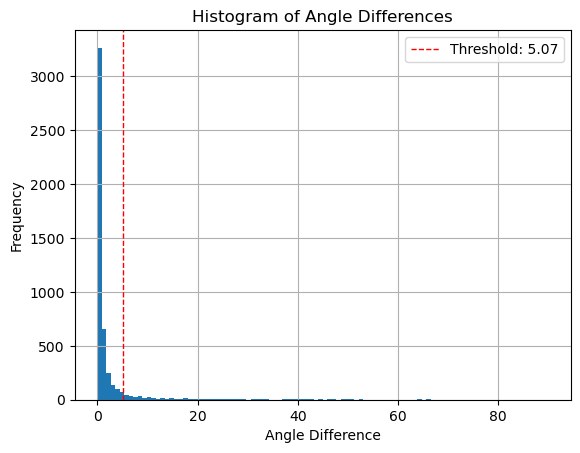

<Figure size 640x480 with 0 Axes>

In [33]:
df_diff.angle_difference.hist(bins=100)
plt.axvline(threshold_value_high, color='red', linestyle='dashed', linewidth=1, label=f'Threshold: {threshold_value_high:.2f}')
plt.xlabel("Angle Difference")
plt.ylabel("Frequency")
plt.title("Histogram of Angle Differences")
plt.legend()
plt.show()

plt.savefig(f"OUTPUT/angle_difference_histogram_{ship_type}.png")

The map below shows all points from df_high_ratio, which represent the threshold exceeding angle difference entries.

In [34]:
map_with_highlighted_points = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=6)
df_high_diff = df_diff[(df_diff['angle_difference'] >= threshold_value_high) & (df_diff["angle_difference"] <= 1000000)]
print(len(df_high_diff))

map_all_ships = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=7)

for imo in df_high_diff['IMO'].unique():
    ship_df = df_high_diff[df_high_diff['IMO'] == imo]
    
    for index, row in ship_df.iterrows():
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=3,
            color='blue',
            fill=True,
            fill_color='blue',
            popup=f"Ship Name: {row['Name']}, SOG: {row['SOG']} knots, Timestamp: {row['Timestamp']}, Angle Difference: {row['angle_difference']}"
        ).add_to(map_all_ships)

map_all_ships

495


In the map below, we now show all the entries of high angle difference again (this time marked with a red circle), as well as previous and subsequent points (with respective 15 min time difference, if given).

In [35]:
highlighted_ship_colors = {}
for imo in df_high_diff['IMO'].unique():
    highlighted_ship_colors[imo] = "#{:06x}".format(random.randint(0, 0xFFFFFF))

map_with_highlighted_points = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=6)
for index, row in df_high_diff.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=8,  # Increase the size of the marker
        color='red',
        fill=True,
        fill_color='red',
        popup=f"High Angle Difference Point: {row['angle_difference']}\nLatitude: {row['Latitude']}\nLongitude: {row['Longitude']}\nAngle: {row['angle']}\nIMO: {row['IMO']}\nTimestamp: {row['# Timestamp']}"
    ).add_to(map_with_highlighted_points)
    
    # Get the previous 3 and next 3 points (15, 30, and 45 minutes before and after)
    ship_df = df_filtered[df_filtered['IMO'] == row['IMO']]
    current_index = ship_df.index.get_loc(index)
    surrounding_points = []
    for offset in [-45, -30, -15, 0, 15, 30, 45]:
        timestamp = row['# Timestamp'] + pd.Timedelta(minutes=offset)
        point = ship_df[ship_df['# Timestamp'] == timestamp]
        if not point.empty:
            surrounding_points.append(point.iloc[0])
    
    line_color = "#{:06x}".format(random.randint(0, 0xFFFFFF))

    # Add the surrounding points to the map
    for surrounding_row in surrounding_points:
        folium.CircleMarker(
            location=[surrounding_row['Latitude'], surrounding_row['Longitude']],
            radius=3,
            color='blue',
            fill=True,
            fill_color='blue',
            popup=f"Timestamp: {surrounding_row['# Timestamp']}, SOG: {surrounding_row['SOG']} knots\nLatitude: {surrounding_row['Latitude']}\nLongitude: {surrounding_row['Longitude']}"
        ).add_to(map_with_highlighted_points)
    
    # Add lines connecting the points from same sequence
    for i in range(1, len(surrounding_points)):
        current_row = surrounding_points[i]
        previous_row = surrounding_points[i - 1]
        folium.PolyLine(
            locations=[[previous_row['Latitude'], previous_row['Longitude']], [current_row['Latitude'], current_row['Longitude']]],
            color=line_color,
            weight=2.5,
            opacity=0.8
        ).add_to(map_with_highlighted_points)

map_with_highlighted_points.save(f"OUTPUT/map_with_highlighted_points_{ship_type}.html")
map_with_highlighted_points

Point Overlay:

It may be that some time sequences show a high difference entry, but is instead displayed as a straight line. This might be due to location overlays of two subsequent time instances. For instance: below a ship is driving steadily over 14 knots, but the two points from 11:00 and 11:15 show the same lattitude and longitude values.

In [36]:
df_filtered[df_filtered["IMO"]=="9250751"]

,MMSI,# Timestamp,Type of mobile,Latitude,Longitude,Navigational status,ROT,SOG,COG,Heading,...,Length,Type of position fixing device,Draught,Destination,ETA,Data source type,A,B,C,D
6554313,257897000,2024-07-21 10:45:00,Class A,56.172853,17.057102,Under way using engine,-0.7,14.3,51.3,51.0,...,183.0,Internal,6.8,FIPOR,2024-07-22 17:30:00,AIS,151.0,32.0,18.0,14.0
6554314,257897000,2024-07-21 11:00:00,Class A,56.190380,17.096588,Under way using engine,0.0,14.3,51.3,50.0,...,183.0,Internal,6.8,FIPOR,2024-07-22 17:30:00,AIS,151.0,32.0,18.0,14.0
6554315,257897000,2024-07-21 11:15:00,Class A,56.190380,17.096588,Under way using engine,0.0,14.3,51.3,50.0,...,183.0,Internal,6.8,FIPOR,2024-07-22 17:00:00,AIS,151.0,32.0,18.0,14.0
6554316,257897000,2024-07-21 11:30:00,Class A,56.263307,17.259512,Under way using engine,-0.7,14.1,51.1,51.0,...,183.0,Internal,6.8,FIPOR,2024-07-22 17:00:00,AIS,151.0,32.0,18.0,14.0


# 3 Check IMO's

In [37]:
df_below_5_knots.to_excel("OUTPUT/df_below_5_knots.xlsx", index=False)
df_high_diff.to_excel("OUTPUT/df_high_diff.xlsx", index=False)

In [38]:
below_5_knots_IMOS = df_below_5_knots["IMO"].unique()
below_5_knots_IMOS

high_diff_IMOS = df_high_diff["IMO"].unique()
high_diff_IMOS

array(['9684110', '9458028', '9479668', '9390305', '9431020', '9843211',
       '9380489', '9401312', '9392183', '9300829', '9386378', '9683001',
       '9724702', '9350757', '9316024', '9345441', '9783124', '9207039',
       '9187057', '9398486', '9503902', '9592276', '9329306', '9379624',
       '9379612', '9309435', '9693070', '9389083', '9724348', '9294680',
       '9939785', '9939797', '9333618', '9291597', '9829784', '9833101',
       '9186352', '9164732', '9250751', '9390991', '9308546', '9488839',
       '8920581', '9623984', '9276389', '9311581', '9553048', '9787936',
       '9148960', '9285859', '9282493', '9390587', '9388754', '9404948',
       '9332781', '9293155', '9282558', '9386536', '9893216', '9278698',
       '9796834', '9337391', '9282912', '9658379', '9321689', '9323376',
       '9314105', '9253313', '9183295', '9257814', '9364588', '9411343',
       '9571038', '9527855', '9577111', '9766205', '9795048', '9428994',
       '9629536', '9726750', '9345908', '9304320', 

In [39]:
df_euSanctioned = pd.read_csv("EU_Sanctioned_Vessels_Cleaned.csv")

# Create a DataFrame with unique IMOs from both below_5_knots_IMOS and high_diff_IMOS
imos = set(below_5_knots_IMOS).union(set(high_diff_IMOS))
df_imos = pd.DataFrame(imos, columns=["IMO"])

# Add binary columns for presence in below_5_knots_IMOS and high_diff_IMOS
df_imos["in_below_5_knots"] = df_imos["IMO"].apply(lambda x: 1 if x in below_5_knots_IMOS else 0)
df_imos["in_high_diff"] = df_imos["IMO"].apply(lambda x: 1 if x in high_diff_IMOS else 0)

# Add a column to indicate whether the ship is sanctioned
sanctioned_imos = df_euSanctioned["IMO"].astype(str).unique()
df_imos["is_sanctioned"] = df_imos["IMO"].apply(lambda x: 1 if x in sanctioned_imos else 0)

df_imos

,IMO,in_below_5_knots,in_high_diff,is_sanctioned
0,9285859,0,1,0
1,9386536,0,1,0
2,9306627,1,0,0
3,9313486,0,1,0
4,9829784,0,1,0
...,...,...,...,...
101,9527855,0,1,0
102,9332781,1,1,0
103,9658379,0,1,0
104,9300829,0,1,0


In [40]:
df_imos[df_imos["is_sanctioned"]==1]

,IMO,in_below_5_knots,in_high_diff,is_sanctioned
19,9341079,0,1,1
70,9323376,0,1,1


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99627764 entries, 0 to 99627763
Data columns (total 26 columns):
 #   Column                          Dtype         
---  ------                          -----         
 0   MMSI                            object        
 1   # Timestamp                     datetime64[ns]
 2   Type of mobile                  object        
 3   Latitude                        float64       
 4   Longitude                       float64       
 5   Navigational status             object        
 6   ROT                             float64       
 7   SOG                             float64       
 8   COG                             float64       
 9   Heading                         float64       
 10  IMO                             object        
 11  Callsign                        object        
 12  Name                            object        
 13  Ship type                       object        
 14  Cargo type                      object        
 

In [45]:
# Filter the sanctioned IMOs
sanctioned_imos = df_imos[df_imos["is_sanctioned"]==1]["IMO"].unique()

# Filter the original dataframe for the sanctioned IMOs and the time range
start_date = df["# Timestamp"].min() - pd.Timedelta(days=1)
end_date = df["# Timestamp"].max() + pd.Timedelta(days=1)
df_sanctioned_routes = df[(df["IMO"].isin(sanctioned_imos)) & (df["# Timestamp"] >= start_date) & (df["# Timestamp"] <= end_date)]

# Create a map
map_sanctioned_routes = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=6)

# Plot the buffer zone
polygon_coords_corrected = [(lat, lon) for lon, lat in polygon_coords]
folium.PolyLine(polygon_coords_corrected, color="green", weight=2.5, opacity=0.8).add_to(map_sanctioned_routes)

# Draw a line in the middle of the buffer zone to represent the cable
mid_line_coords = [(polygon.centroid.y, polygon.centroid.x), (polygon.centroid.y, polygon.centroid.x)]
folium.PolyLine(mid_line_coords, color="blue", weight=2.5, opacity=0.8, dash_array='5, 10').add_to(map_sanctioned_routes)

# Plot the routes for each sanctioned ship
for imo in df_sanctioned_routes["IMO"].unique():
    ship_df = df_sanctioned_routes[df_sanctioned_routes["IMO"] == imo]
    ship_df = ship_df.sort_values(by="# Timestamp")
    
    # Add the route to the map
    folium.PolyLine(
        locations=ship_df[["Latitude", "Longitude"]].values,
        color='red',
        weight=2.5,
        opacity=0.8,
        popup=f"IMO: {imo}"
    ).add_to(map_sanctioned_routes)

map_sanctioned_routes.save("OUTPUT/map_sanctioned_routes_with_buffer.html")
map_sanctioned_routes

In [72]:
from folium.plugins import TimestampedGeoJson

# Create the map
map_sanctioned_routes_layers = folium.Map(location=[polygon.centroid.y, polygon.centroid.x], zoom_start=6)

# Plot the buffer zone
polygon_coords_corrected = [(lat, lon) for lon, lat in polygon_coords]
folium.PolyLine(polygon_coords_corrected, color="green", weight=2.5, opacity=0.8).add_to(map_sanctioned_routes_layers)

# Draw a line in the middle of the buffer zone to represent the cable
mid_line_coords = [(polygon.centroid.y, polygon.centroid.x), (polygon.centroid.y, polygon.centroid.x)]
folium.PolyLine(mid_line_coords, color="blue", weight=2.5, opacity=0.8, dash_array='5, 10').add_to(map_sanctioned_routes_layers)

# Create layers for each sanctioned IMO
for sanctioned_ship_imo in sanctioned_imos:
    # Select one specific timestamp for the sanctioned ship
    specific_timestamp = df_filtered[df_filtered["IMO"] == sanctioned_ship_imo]["# Timestamp"].iloc[0]

    # Filter the data to only include records from 24 hours before and 24 hours after the specific timestamp
    time_window = pd.Timedelta(hours=24)
    filtered_suspicious_dates = df[
        (df["IMO"] == sanctioned_ship_imo) &
        (df["# Timestamp"] >= specific_timestamp - time_window) &
        (df["# Timestamp"] <= specific_timestamp + time_window)
    ]

    # Prepare the data for TimestampedGeoJson
    features = []
    for _, row in filtered_suspicious_dates.iterrows():
        feature = {
            'type': 'Feature',
            'geometry': {
                'type': 'Point',
                'coordinates': [row['Longitude'], row['Latitude']],
            },
            'properties': {
                'time': row['# Timestamp'].isoformat(),
                'popup': f"IMO: {row['IMO']}, Name: {row['Name']}, Timestamp: {row['# Timestamp']}",
                'icon': 'circle',
                'iconstyle': {
                    'fillColor': 'red',
                    'fillOpacity': 0.6,
                    'stroke': 'true',
                    'radius': 5
                }
            }
        }
        features.append(feature)

    # Create the TimestampedGeoJson object
    timestamped_geojson = TimestampedGeoJson(
        {
            'type': 'FeatureCollection',
            'features': features,
        },
        period='PT1H',  # Time interval for each frame
        add_last_point=True,
        auto_play=True,
        loop=False,
        max_speed=1,
        loop_button=True,
        date_options='YYYY-MM-DD HH:mm:ss',
        time_slider_drag_update=True
    )

    # Add the TimestampedGeoJson object directly to the map
    timestamped_geojson.add_to(map_sanctioned_routes_layers)

# Add layer control to the map
folium.LayerControl().add_to(map_sanctioned_routes_layers)

# Save the map
map_sanctioned_routes_layers.save("OUTPUT/map_sanctioned_routes_layers.html")

map_sanctioned_routes_layers


# 4 GeoPandas Approach

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from geodatasets import get_path
import polars as pl
import pyarrow.parquet as pq
import dask.dataframe as dd

import folium
from shapely.geometry import MultiLineString
from shapely.ops import transform
import pyproj
from shapely import wkt

import folium
from folium.plugins import HeatMap
import datetime

In [3]:
cables = gpd.read_file("data/geom/cable-geo.json")
cables.head(10)

,id,name,color,feature_id,geometry
0,tasman-express-tx,Tasman Express (TX),#939597,tasman-express-tx-0,"MULTILINESTRING ((151.25776 -33.91398, 152.099..."
1,padang-tua-pejat,Padang-Tua Pejat,#7c9e3e,padang-tua-pejat-0,"MULTILINESTRING ((100.36169 -0.94389, 99.58896..."
2,gc-lnz-fu-ring,GC-LNZ-FU Ring,#939597,gc-lnz-fu-ring-0,"MULTILINESTRING ((-13.82732 28.86342, -13.9319..."
3,arctic-way,Arctic Way,#939597,arctic-way-0,"MULTILINESTRING ((14.40006 67.28600, 10.99098 ..."
4,thailand-domestic-submarine-cable-network-tdscn,Thailand Domestic Submarine Cable Network (TDSCN),#8aaa3d,thailand-domestic-submarine-cable-network-tdscn-0,"MULTILINESTRING ((100.92476 13.17239, 99.95362..."
5,cat-submarine-network-csn,CAT Submarine Network (CSN),#3851a3,cat-submarine-network-csn-0,"MULTILINESTRING ((100.93057 13.17437, 100.8095..."
6,orca,ORCA,#939597,orca-0,"MULTILINESTRING ((-129.59983 36.87322, -122.39..."
7,ice-iv,ICE IV,#939597,ice-iv-0,"MULTILINESTRING ((103.85311 1.29388, 103.61250..."
8,cyclades-a,Cyclades A,#4aba79,cyclades-a-0,"MULTILINESTRING ((24.05381 37.71108, 24.11256 ..."
9,cyclades-b,Cyclades B,#824198,cyclades-b-0,"MULTILINESTRING ((25.23815 37.12223, 25.29381 ..."


## 4.1 Create Cable Buffer Zone

In [12]:
def plotcable(cablename):
    # Step 1: Extract the geometry from the first row of the 'cables' DataFrame
    #limited_geometry = MultiLineString(list(cables["geometry"][0].geoms)[:10])
    limited_geometry = cables[cables["name"] == cablename]["geometry"].iloc[0]

    # Step 3: Get the centroid to center the map
    center = limited_geometry.centroid.coords[0]
    map_center = [center[1], center[0]]  # Reverse for lat/lon order

    # Step 4: Initialize the map with the geometry's center
    m = folium.Map(location=map_center, zoom_start=6)

    # Step 5: Set up pyproj transformers
    crs_wgs84 = pyproj.CRS("EPSG:4326")  # WGS84 (Lat/Lon)
    crs_mercator = pyproj.CRS("EPSG:3395")  # Mercator (for buffering)
    transformer = pyproj.Transformer.from_crs(crs_wgs84, crs_mercator, always_xy=True)
    inverse_transformer = pyproj.Transformer.from_crs(crs_mercator, crs_wgs84, always_xy=True)

    # Step 6: Buffer distance in meters (5 km)
    buffer_distance = 50000

    # Step 7: Project the geometry to Mercator for buffering
    geom_projected = transform(transformer.transform, limited_geometry)

    # Step 8: Create a buffer around the projected geometry
    buffer = geom_projected.buffer(buffer_distance)

    # Step 9: Convert the buffer back to WGS84
    buffer_wgs84 = transform(inverse_transformer.transform, buffer)

    # Step 10: Add the original geometry and the buffer to the map
    folium.GeoJson(limited_geometry).add_to(m)
    folium.GeoJson(buffer_wgs84).add_to(m)

    # # Step 11: Save the map to an HTML file
    # m.save(f"cable_map_{cablename}.html")

    # Create a GeoDataFrame with the buffer_wgs84 polygon
    gdf = gpd.GeoDataFrame([{'geometry': buffer_wgs84}], crs="EPSG:4326")

    # # Save the GeoDataFrame to a GeoJSON file
    # gdf.to_file(f"{cablename}.geojson", driver="GeoJSON")

    # FOR INLINE PRINT UNCOMMENT
    print(display(m))

    return(buffer_wgs84, limited_geometry)

## 4.2 Import Incident List

In [8]:
data = [
    {
        "seaCable": "Nord Stream 1 and 2",
        "date": "September 2022",
        "coordinates": "Unknown",
        "allegedShip": "Unknown",
        "incident": "Nord Stream Pipeline Explosions"
    },
    {
        "seaCable": "BCS East-West",
        "date": "November 17, 2024",
        "coordinates": "Near Gotland, Sweden",
        "allegedShip": "Yi Peng 3",
        "incident": "2024 Baltic Sea Submarine Cable Disruptions"
    },
    {
        "seaCable": "C-Lion1",
        "date": "November 18, 2024",
        "coordinates": "Between Gotland and Öland, Sweden",
        "allegedShip": "Yi Peng 3",
        "incident": "2024 Baltic Sea Submarine Cable Disruptions"
    },
    {
        "seaCable": "Estlink 2",
        "date": "December 25, 2024",
        "coordinates": "Between Finland and Estonia",
        "allegedShip": "Eagle S",
        "incident": "Estlink 2 Damage Incident"
    },
    {
        "seaCable": "Unnamed fibre-optic cable",
        "date": "March 2025",
        "coordinates": "Between Latvia and Gotland, Sweden",
        "allegedShip": "Unknown",
        "incident": "Baltic Sea Cable Disruption"
    },
    {
        "seaCable": "Matsu Islands Cables",
        "date": "February 2025",
        "coordinates": "Taiwan Strait",
        "allegedShip": "Hongtai",
        "incident": "Matsu Islands Cable Cut Incident"
    }
]

incidents = pd.DataFrame(data)

### 4.3.1 Traceback BCS East West

Ship IMO: 9224984
Cable Name: BCS East-West Interlink
Date: November 17, 2024

In [14]:
buffer, cable = plotcable("BCS East-West Interlink")

/opt/anaconda3/envs/shadow/lib/python3.13/site-packages/shapely/constructive.py:180: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


None


In [16]:
df = dd.read_parquet('aisdk-2024-15m.parquet')

In [22]:
# filter df for data where the timestamp is on the date of the incident (November 17, 2024)
df_date = df[df["# Timestamp"].dt.strftime('%Y-%m-%d').str.contains("2024-11-17")]